In [46]:
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import random
from collections import Counter

# Init Variables

In [47]:
NODE_NUMBER = 1000
MAX_EDGE_NUMBER = (NODE_NUMBER) * (NODE_NUMBER - 1) / 2
EDGE_PROBABILITY = 0.01
EDGE_NUMBER = int(MAX_EDGE_NUMBER * EDGE_PROBABILITY)  # Approximately 0.05 of max possible edge number
GRAPH_NUMBER = 100
FAILURE = [i/100 for i in range(5, 80, 5)]
SIMULATION_NUMBER = 100
COLOR = ['red', 'green', 'blue', 'gray', 'yellow', 'brown', 'black']

# Functions

### Eigvals

In [62]:
def get_eigvals(graph):
    L = nx.normalized_laplacian_matrix(G)
    e = np.linalg.eigvals(L.toarray())
    return e

### Algebraic Connectivity

In [63]:
def get_algebraic_connectivity(graph, show_plot=False):
    e = get_eigvals(graph)
    if show_plot:
        plt.ytitle('values')
        plt.xtitle('index')
        plt.hist(e, bins=100)  # histogram with 100 bins
        plt.xlim(0, 2)  # eigenvalues between 0 and 2
        plt.show()
    e = np.sort(e)
    return e[1]

### Plotting Graphs

In [49]:
def show_graph(graph, path=None):
    pos = nx.circular_layout(graph)
    plt.figure(figsize = (12, 12))
    nx.draw_networkx(graph, pos)
    if path != None:
        plt.savefig(path+'.png')
    plt.show()

### Degree Distribution

In [50]:
def degree_distribution(graph, path=None, style='-o'):
    degrees = [graph.degree(n) for n in graph.nodes()]
    degrees = list(sorted(degrees))
    degree_freq_dic = Counter(degrees)
    x_axis = degree_freq_dic.keys()
    y_axis = degree_freq_dic.values()
    y_axis = np.array(list(y_axis)) / len(degrees)
    
    plt.title('Degree Distribution')
    plt.xlabel("Degree")
    plt.ylabel("Frequesncy")
    plt.plot(x_axis, y_axis, style, label='degree probability')
    
    upper_y = np.array([0, max(y_axis)])
    avg = np.average(degrees)
    upper_x = np.array([avg, avg])
    plt.plot(upper_x, upper_y, color='red', linestyle='-.', label='mean')
    plt.legend(loc='best') # setting best location for labels
    
    if path != None:
        plt.savefig(path+'.png')
    plt.show()

### Double-Log

In [51]:
def double_log(graph, path=None, style='-o'):
    degrees = [graph.degree(n) for n in graph.nodes()]
    degrees = list(sorted(degrees))
    degree_freq_dic = Counter(degrees)
    unique_degrees = list(degree_freq_dic.keys())
    frequency = list(degree_freq_dic.values())
    x_axis = np.log(unique_degrees)
    y_axis = np.log(frequency)
    y_axis = np.array(list(y_axis)) / len(degrees)
    plt.xlabel("Degree")
    plt.ylabel("Degree Distribution")
    plt.title('Double Log')
    plt.plot(x_axis, y_axis, style, label='degree distribution')
    if path != None:
        plt.savefig(path+'.png')
    plt.show()

# Making Graphs

### Small-World (watts-storgatz)

In [52]:
small_worlds = []

k = round(((2 * EDGE_NUMBER) / NODE_NUMBER))

for i in range(GRAPH_NUMBER):
    print('Graph No: ', i)
    # we want to have EDGE_NUMBER edge, and in the base graph we have k degree
    # for each node. And we know summation of node degrees, is 2 * EDGE_NUMBER
    # so we have tohave k = (2 * EDGE_NUMBER) / NODE_NUMBER  for each node.
    rewiring_probability = random.uniform(0.2, 0.3)
    graph = graph = nx.watts_strogatz_graph(n=NODE_NUMBER, k=k, p=rewiring_probability)
    small_worlds.append(graph)
#     show_graph(graph)

Graph No:  0
Graph No:  1
Graph No:  2
Graph No:  3
Graph No:  4
Graph No:  5
Graph No:  6
Graph No:  7
Graph No:  8
Graph No:  9
Graph No:  10
Graph No:  11
Graph No:  12
Graph No:  13
Graph No:  14
Graph No:  15
Graph No:  16
Graph No:  17
Graph No:  18
Graph No:  19
Graph No:  20
Graph No:  21
Graph No:  22
Graph No:  23
Graph No:  24
Graph No:  25
Graph No:  26
Graph No:  27
Graph No:  28
Graph No:  29
Graph No:  30
Graph No:  31
Graph No:  32
Graph No:  33
Graph No:  34
Graph No:  35
Graph No:  36
Graph No:  37
Graph No:  38
Graph No:  39
Graph No:  40
Graph No:  41
Graph No:  42
Graph No:  43
Graph No:  44
Graph No:  45
Graph No:  46
Graph No:  47
Graph No:  48
Graph No:  49
Graph No:  50
Graph No:  51
Graph No:  52
Graph No:  53
Graph No:  54
Graph No:  55
Graph No:  56
Graph No:  57
Graph No:  58
Graph No:  59
Graph No:  60
Graph No:  61
Graph No:  62
Graph No:  63
Graph No:  64
Graph No:  65
Graph No:  66
Graph No:  67
Graph No:  68
Graph No:  69
Graph No:  70
Graph No:  71
Gr

#### Degree Distribution

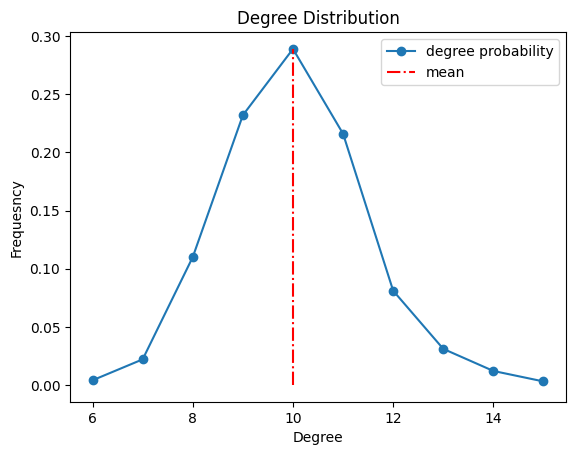

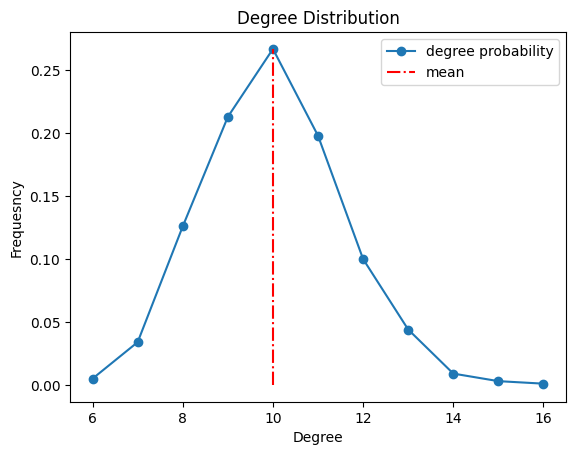

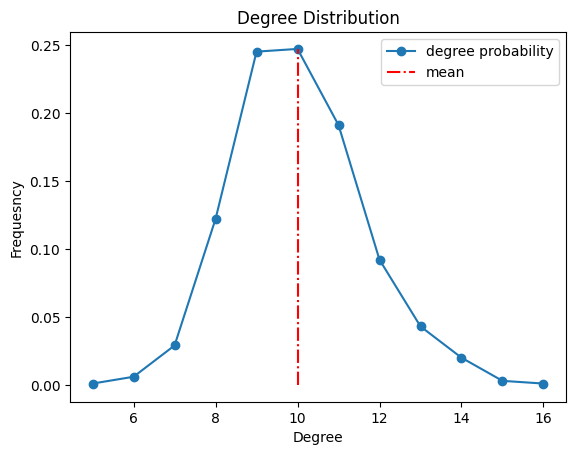

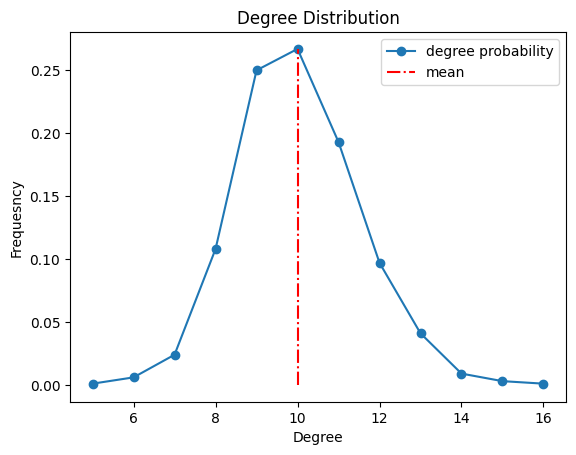

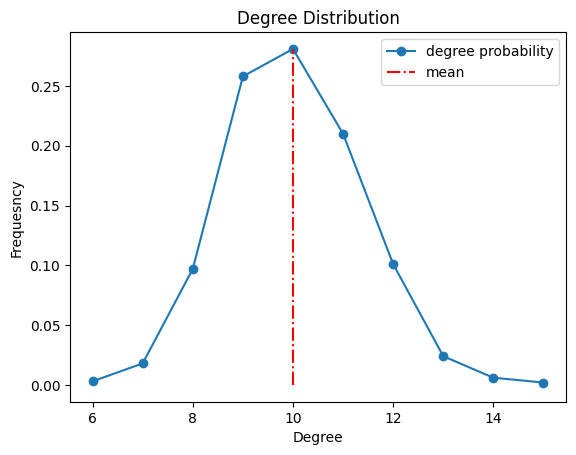

...

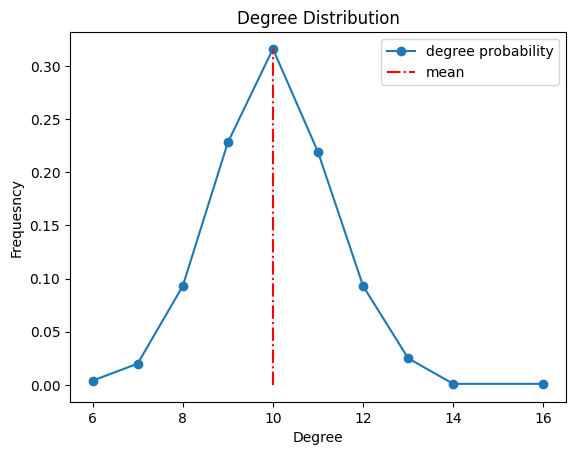

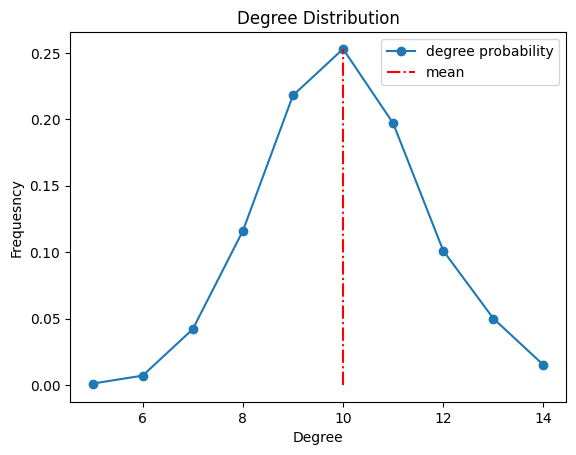

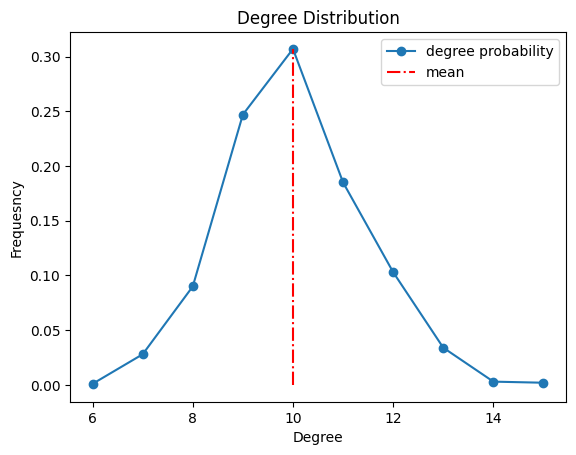

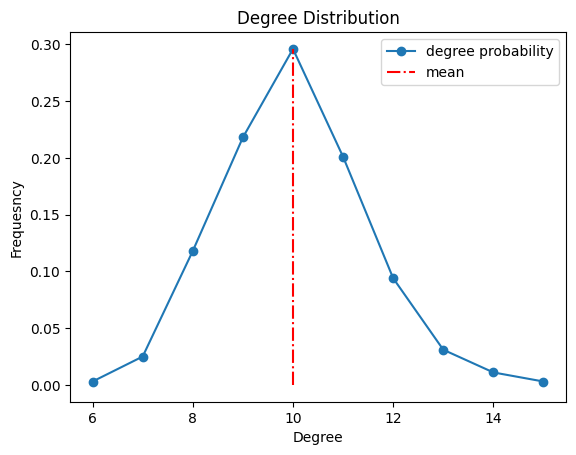

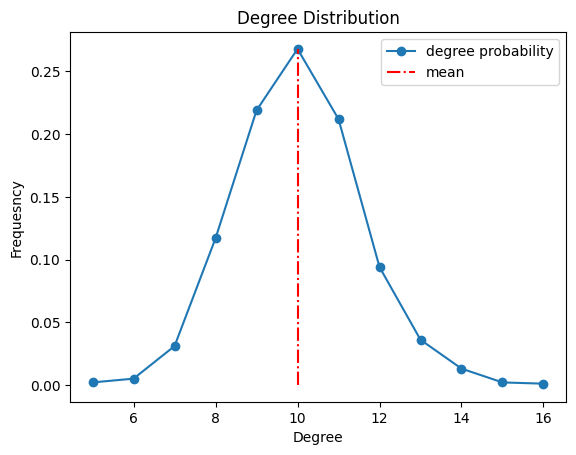

In [53]:
for graph in small_worlds:
    degree_distribution(graph)

### Scale-Free (barabasi-albert)

In [54]:
seed_values = random.sample(range(1, 1000), GRAPH_NUMBER) # generating GRAPH_NUMBER unique random number to be used as seed

m = round(((2 * EDGE_NUMBER) / NODE_NUMBER))

scale_frees = []

for i in range(GRAPH_NUMBER):
    print('Graph no: ', i)
    graph = nx.barabasi_albert_graph(n=NODE_NUMBER, m=k, seed=seed_values[i], initial_graph=None)
    scale_frees.append(graph)
    
#     show_graph(graph)

Graph no:  0
Graph no:  1
Graph no:  2
Graph no:  3
Graph no:  4
Graph no:  5
Graph no:  6
Graph no:  7
Graph no:  8
Graph no:  9
Graph no:  10
Graph no:  11
Graph no:  12
Graph no:  13
Graph no:  14
Graph no:  15
Graph no:  16
Graph no:  17
Graph no:  18
Graph no:  19
Graph no:  20
Graph no:  21
Graph no:  22
Graph no:  23
Graph no:  24
Graph no:  25
Graph no:  26
Graph no:  27
Graph no:  28
Graph no:  29
Graph no:  30
Graph no:  31
Graph no:  32
Graph no:  33
Graph no:  34
Graph no:  35
Graph no:  36
Graph no:  37
Graph no:  38
Graph no:  39
Graph no:  40
Graph no:  41
Graph no:  42
Graph no:  43
Graph no:  44
Graph no:  45
Graph no:  46
Graph no:  47
Graph no:  48
Graph no:  49
Graph no:  50
Graph no:  51
Graph no:  52
Graph no:  53
Graph no:  54
Graph no:  55
Graph no:  56
Graph no:  57
Graph no:  58
Graph no:  59
Graph no:  60
Graph no:  61
Graph no:  62
Graph no:  63
Graph no:  64
Graph no:  65
Graph no:  66
Graph no:  67
Graph no:  68
Graph no:  69
Graph no:  70
Graph no:  71
Gr

#### Degree Distribution

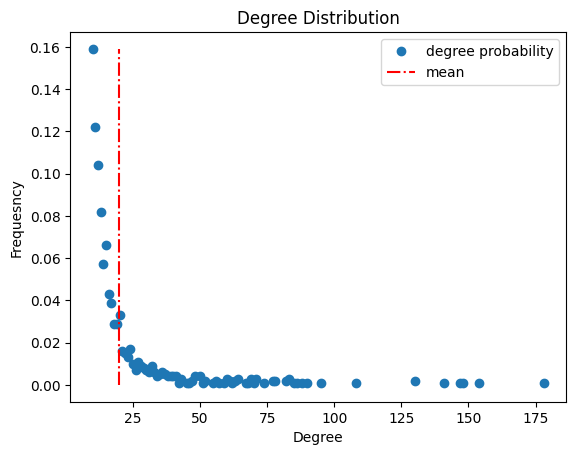

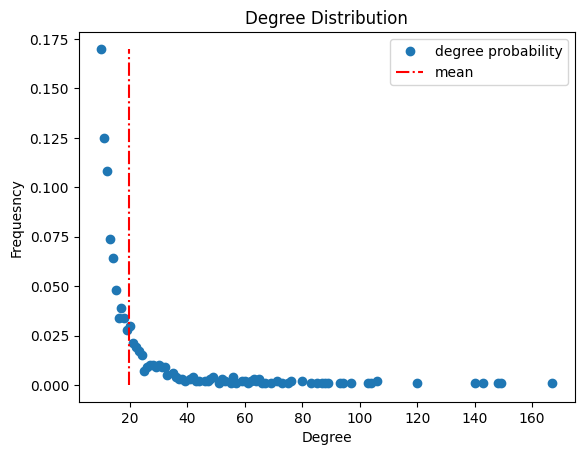

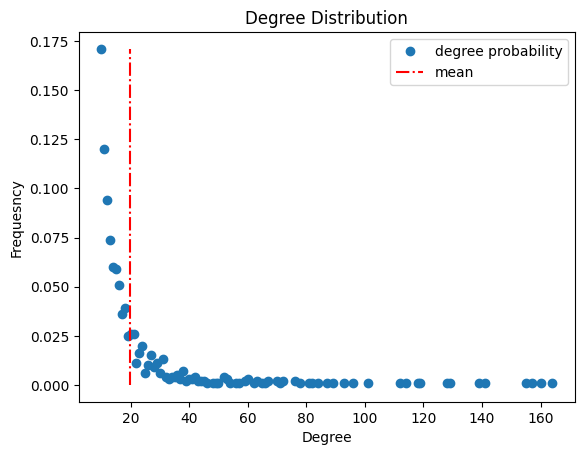

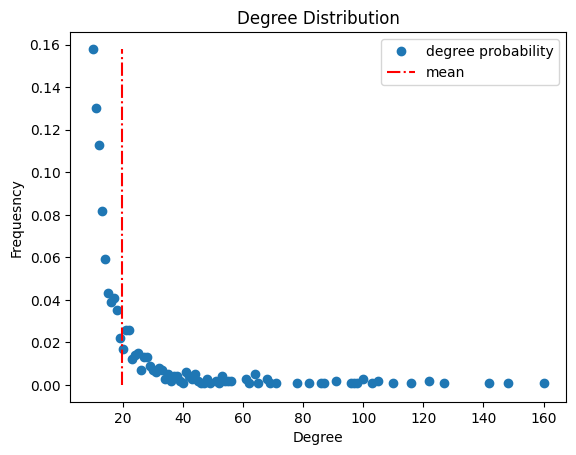

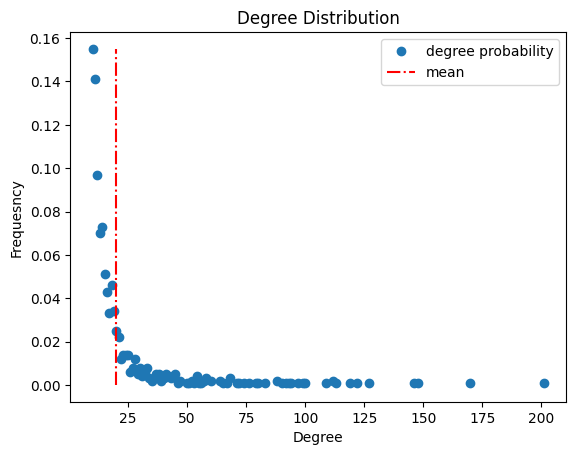

...

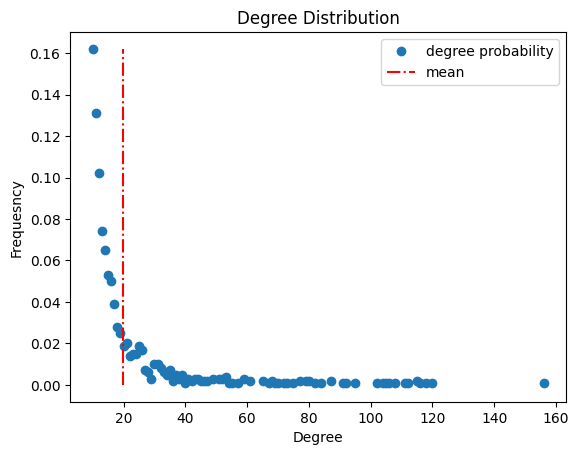

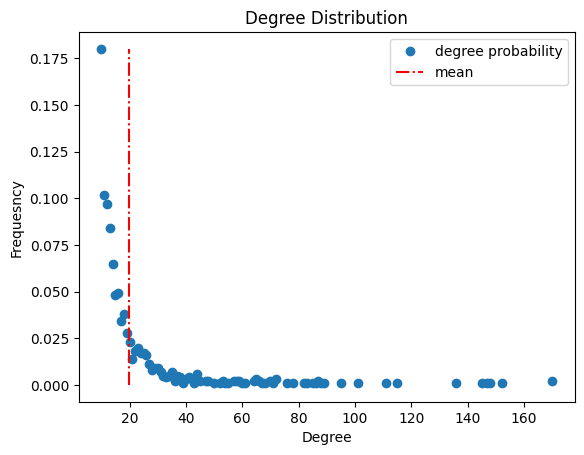

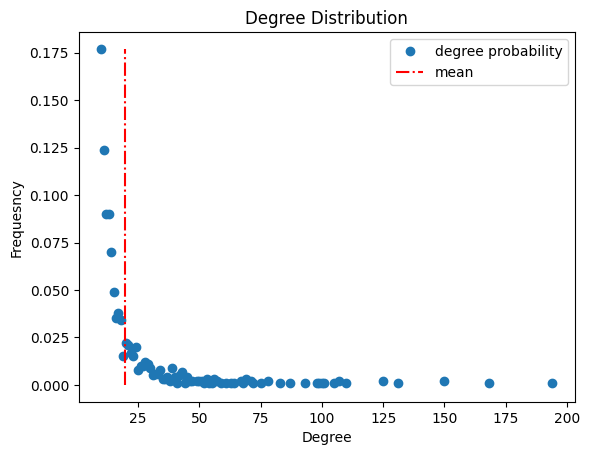

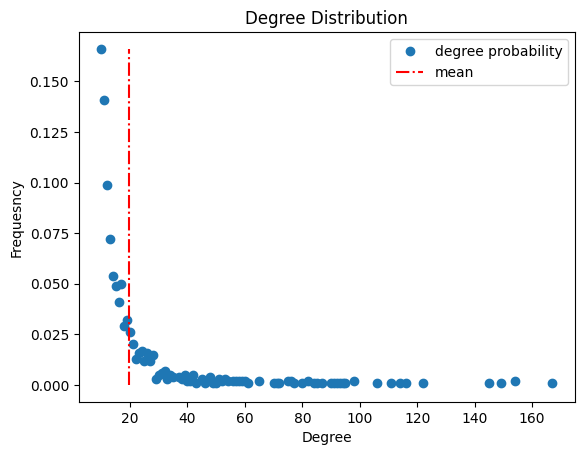

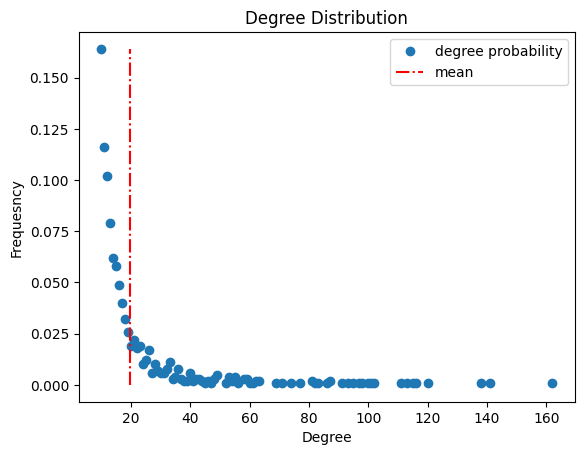

In [55]:
for graph in scale_frees:
    degree_distribution(graph, style='o')

#### Log-Log Plot

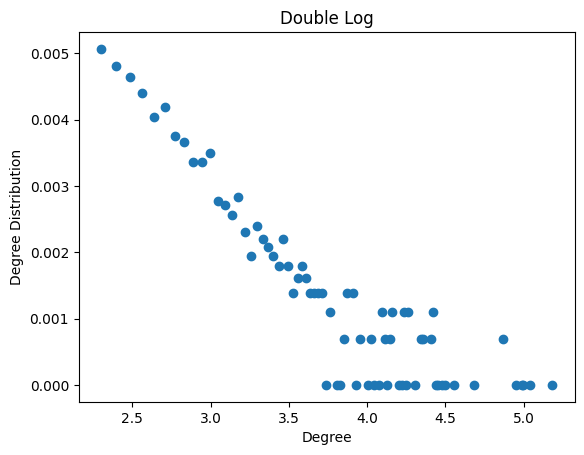

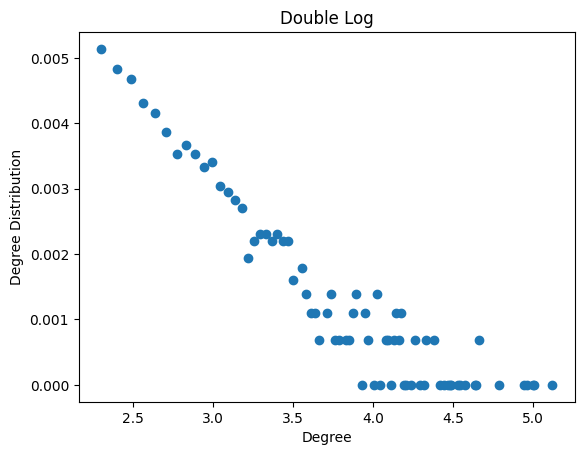

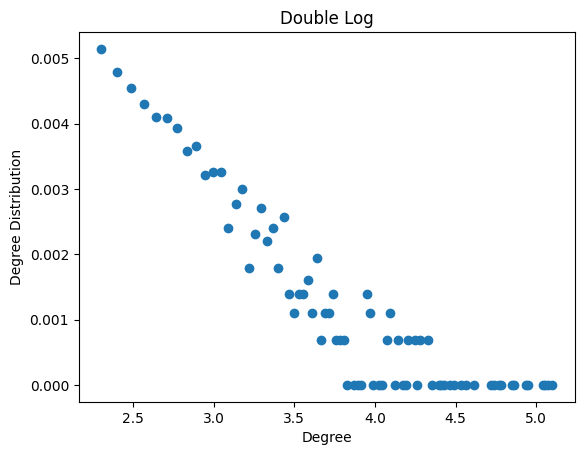

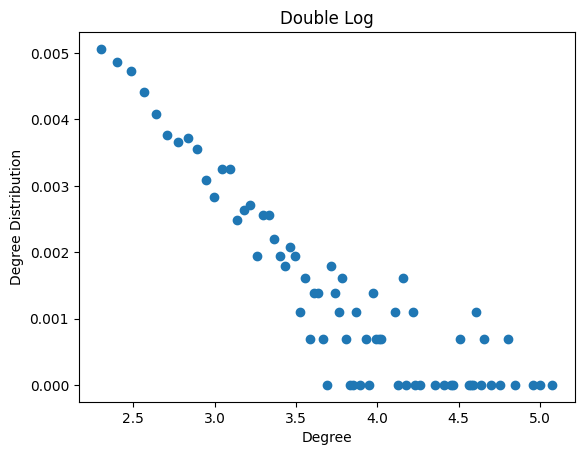

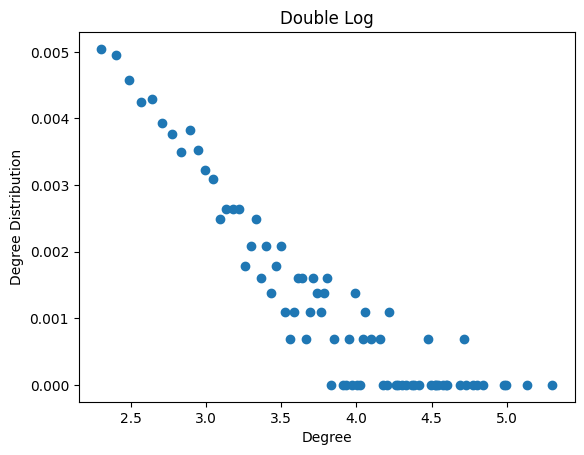

...

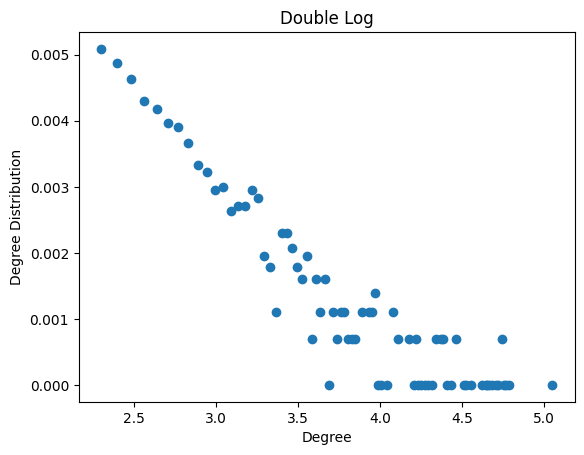

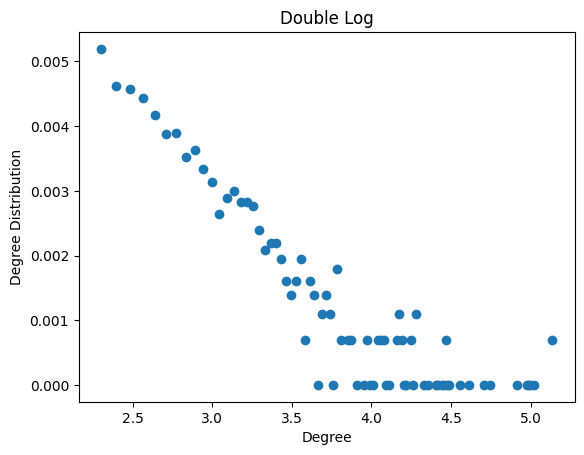

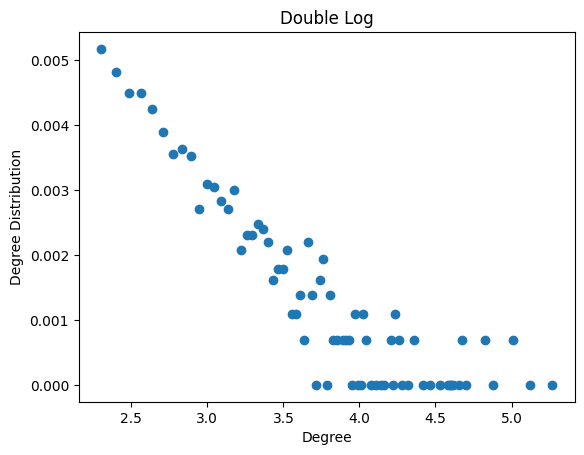

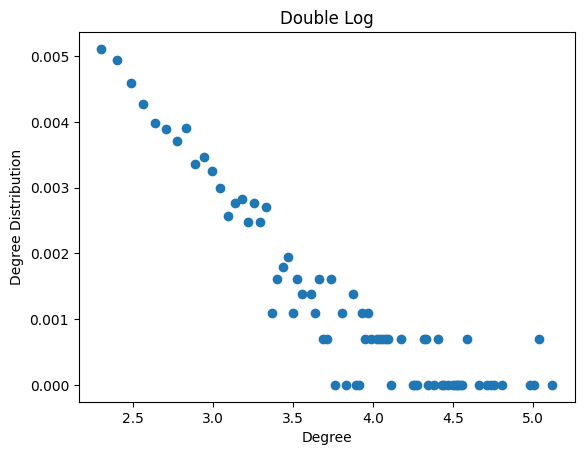

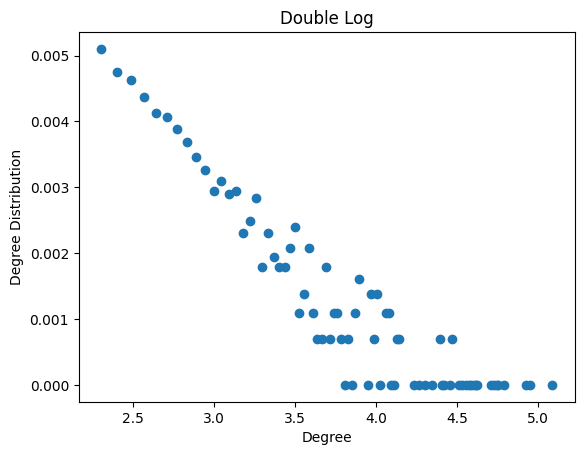

In [56]:
for graph in scale_frees:
    double_log(graph, style='o')

### Random

In [57]:
randoms = []
for i in range(GRAPH_NUMBER):
    print('graph no: ', i)
    graph = nx.erdos_renyi_graph(NODE_NUMBER, EDGE_PROBABILITY)
    randoms.append(graph)

graph no:  0
graph no:  1
graph no:  2
graph no:  3
graph no:  4
graph no:  5
graph no:  6
graph no:  7
graph no:  8
graph no:  9
graph no:  10
graph no:  11
graph no:  12
graph no:  13
graph no:  14
graph no:  15
graph no:  16
graph no:  17
graph no:  18
graph no:  19
graph no:  20
graph no:  21
graph no:  22
graph no:  23
graph no:  24
graph no:  25
graph no:  26
graph no:  27
graph no:  28
graph no:  29
graph no:  30
graph no:  31
graph no:  32
graph no:  33
graph no:  34
graph no:  35
graph no:  36
graph no:  37
graph no:  38
graph no:  39
graph no:  40
graph no:  41
graph no:  42
graph no:  43
graph no:  44
graph no:  45
graph no:  46
graph no:  47
graph no:  48
graph no:  49
graph no:  50
graph no:  51
graph no:  52
graph no:  53
graph no:  54
graph no:  55
graph no:  56
graph no:  57
graph no:  58
graph no:  59
graph no:  60
graph no:  61
graph no:  62
graph no:  63
graph no:  64
graph no:  65
graph no:  66
graph no:  67
graph no:  68
graph no:  69
graph no:  70
graph no:  71
gr

### Degree Distribution

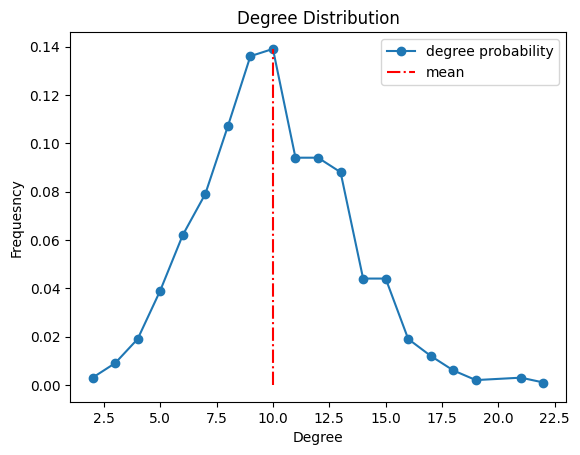

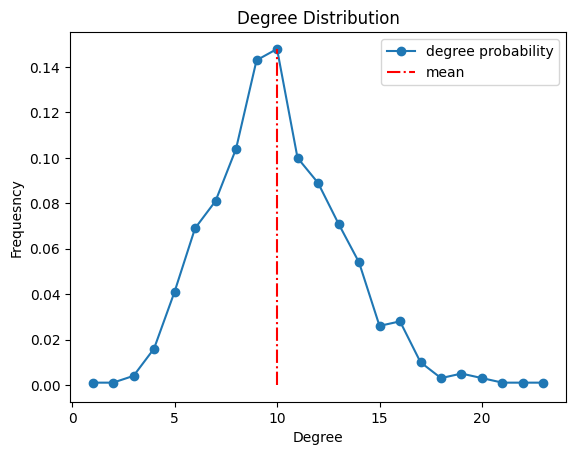

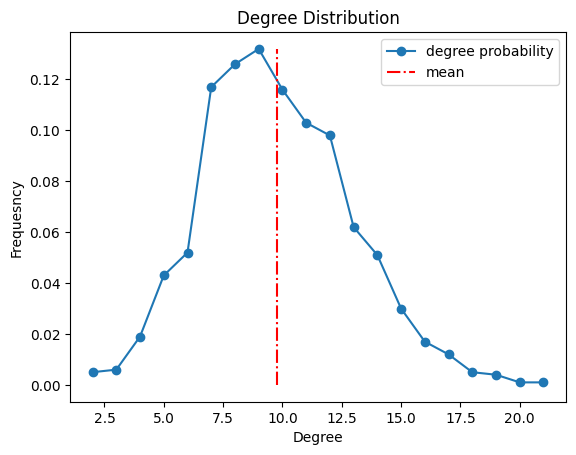

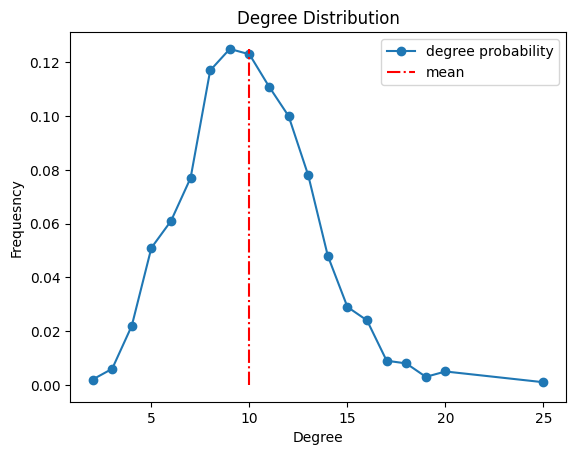

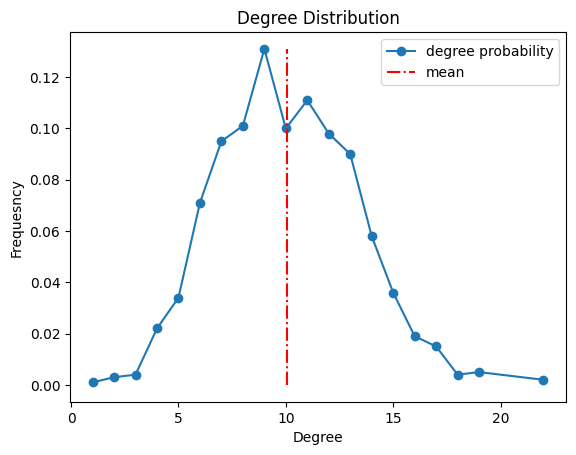

...

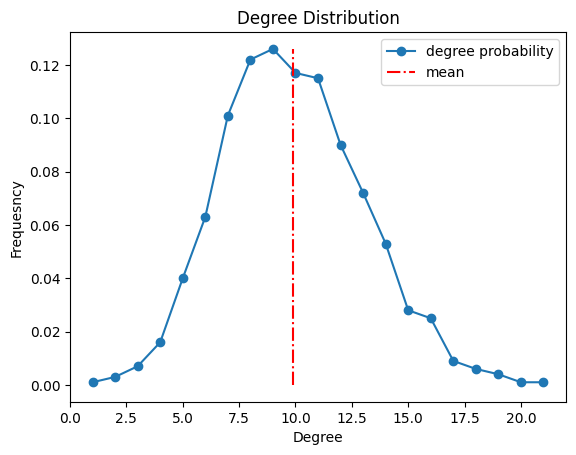

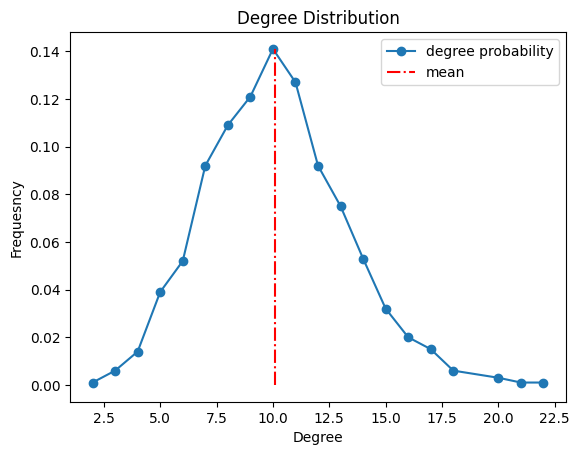

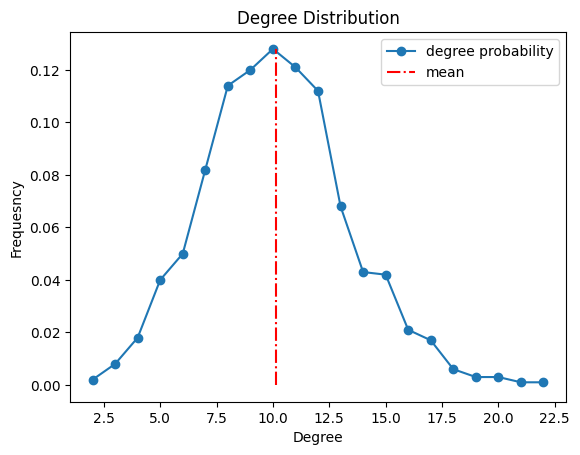

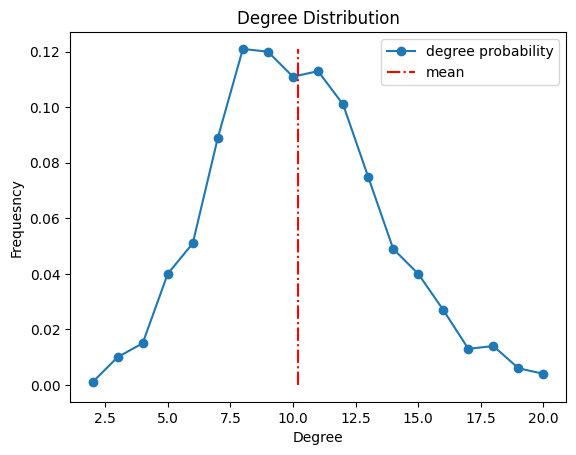

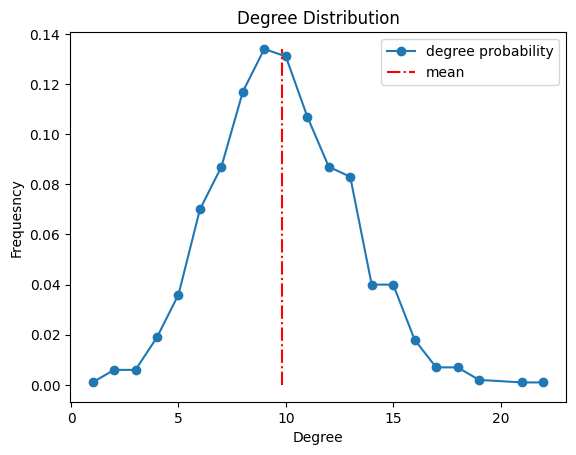

In [65]:
for graph in randoms:
    degree_distribution(graph)

# Calculate Algebric Connectivity

In [64]:
# ac = algebraic connectivity
small_worlds_ac = []
scale_frees_ac = [] 
randoms_ac = []

for i in range(GRAPH_NUMBER):
    small_worlds_ac.append(get_algebraic_connectivity(small_worlds[i]))
    scale_frees_ac.append(get_algebraic_connectivity(scale_frees[i]))
    randoms_ac.append(get_algebraic_connectivity(randoms[i]))